In [62]:
import pandas as pd
import os
import glob
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, roc_auc_score, auc
import shutil
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
import random
from tensorflow.keras.models import load_model


In [63]:
path = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/train' 
path_test = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/test' 

path_destino = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/train_modi_1/' 
path_de_test = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/test_modi_1/' 

In [64]:

def imagen_90 (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.rotate(90)
    return x

def imagen_hor (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.transpose(Image.FLIP_LEFT_RIGHT)
    return x

def imagen_ver (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.transpose(Image.FLIP_TOP_BOTTOM)
    return x

In [103]:
def cambio_carpetas(path,path_destino):
    imagenes=[]
    count=0
    for directorio, subdirectorios, archivos in os.walk(path):
        for archivo in archivos:
            if archivo.endswith('.jpg') or archivo.endswith('.png'):
                archivo_path = os.path.join(directorio, archivo)
                imagenes.append(archivo_path)
    for i in imagenes :
        if i.replace(path,"").split('\\')[1] != 'Packages':
            if path != path_test :
                ruta = path_destino+i.replace(path,"").split('\\')[2]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    count+=1
                else :
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    count+=1
            else :
                ruta = path_destino+i.replace(path,"").split('\\')[2]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                else :
                    shutil.copy(i,ruta)
                count+=1
    print(count)

In [105]:
cambio_carpetas(path,path_destino)
cambio_carpetas(path_test,path_de_test)

1776
1704


In [70]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20, 
                                   width_shift_range=0.2, 
                                   height_shift_range=0.2, 
                                   shear_range=0.2, 
                                   zoom_range=0.2, 
                                   horizontal_flip=True, 
                                   fill_mode='nearest')


In [71]:
img_height = 348
img_width = 348
batch_size = 32

In [72]:
train_generator = train_datagen.flow_from_directory(
    path_destino,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical') 

Found 7104 images belonging to 34 classes.


In [73]:
val_datagen = ImageDataGenerator(rescale=1./255)

In [74]:
val_generator = val_datagen.flow_from_directory(
    path_de_test,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical') 

Found 1704 images belonging to 34 classes.


In [75]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

C:\Users\jacar\AppData\Local\Temp\ipykernel_6052\2631993559.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))


In [ ]:
for layer in base_model.layers[:100]:
    layer.trainable = False
for layer in base_model.layers[100:]:
    layer.trainable = True

In [ ]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(34, activation='softmax') 
])

In [82]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [83]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator
)

Epoch 1/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 345s 2s/step - accuracy: 0.4611 - loss: 2.1336 - val_accuracy: 0.4396 - val_loss: 2.6385
Epoch 2/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 301s 1s/step - accuracy: 0.9363 - loss: 0.2626 - val_accuracy: 0.5153 - val_loss: 2.6608
Epoch 3/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 301s 1s/step - accuracy: 0.9743 - loss: 0.0971 - val_accuracy: 0.5775 - val_loss: 3.0448
Epoch 4/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 302s 1s/step - accuracy: 0.9875 - loss: 0.0512 - val_accuracy: 0.5886 - val_loss: 3.4013
Epoch 5/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 301s 1s/step - accuracy: 0.9903 - loss: 0.0354 - val_accuracy: 0.5792 - val_loss: 4.2025
Epoch 6/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 305s 1s/step - accuracy: 0.9931 - loss: 0.0272 - val_accuracy: 0.6162 - val_loss: 4.3550
Epoch 7/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 309s 1s/step - accuracy: 0.9960 - loss: 0.0176 - val_accuracy: 0.5892 - val_loss: 4.8343
Epoch 8/10
222/222 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - accuracy: 0.9924 - loss: 0.0244 - val_accu

In [84]:
model.save('Model_final.h5')

In [ ]:
model = load_model("/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/Model_final.h5")

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 11, 11, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 34)             │        17,442 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,931,300 (11.18 MB)

 Trainable params: 2,534,754 (9.67 MB)

 Non-trainable params: 396,544 (1.51 MB)

 Optimizer params: 2 (12.00 B)

In [86]:
score = model.evaluate(val_generator, verbose=1)
print(f'Pérdida: {score[0]}, Precisión: {score[1]}')

54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 566ms/step - accuracy: 0.5838 - loss: 5.7313
Pérdida: 5.435580730438232, Precisión: 0.6038732528686523


In [ ]:


X_test = []
y_test = []

for i in range(len(val_generator)):
    batch_x, batch_y = next(val_generator)
    X_test.append(batch_x)
    y_test.append(batch_y)


X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

print("Forma de X_test:", X_test.shape) 
print("Forma de y_test:", y_test.shape)  


Forma de X_test: (1704, 348, 348, 3)
Forma de y_test: (1704, 34)


In [88]:

y_test = np.argmax(y_test, axis=1)

In [89]:
y_test

array([28, 25, 19, ..., 31,  0, 23], dtype=int64)

In [90]:
y_pred = model.predict(X_test)

54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 573ms/step


In [91]:
y_pred = np.argmax(y_pred, axis=1)

In [92]:
y_pred

array([28, 25, 30, ..., 31,  0, 23], dtype=int64)

In [53]:
print("Precision:")
print("- Test:", precision_score(y_test, y_pred, average='weighted'))
print("\nRecall:")
print("- Test:", recall_score(y_test, y_pred, average='weighted'))
print("\nF1:")
print("- Test:", f1_score(y_test, y_pred, average='weighted'))


Precision:
- Test: 0.5717052500913099

Recall:
- Test: 0.5818913480885312

F1:
- Test: 0.5715470832710129


In [93]:
class_names = val_generator.class_indices
print(class_names)

{'Apple': 0, 'Asparagus': 1, 'Aubergine': 2, 'Avocado': 3, 'Banana': 4, 'Cabbage': 5, 'Carrots': 6, 'Cucumber': 7, 'Garlic': 8, 'Ginger': 9, 'Kiwi': 10, 'Leek': 11, 'Lemon': 12, 'Lime': 13, 'Mango': 14, 'Melon': 15, 'Mushroom': 16, 'Nectarine': 17, 'Onion': 18, 'Orange': 19, 'Papaya': 20, 'Passion-Fruit': 21, 'Peach': 22, 'Pear': 23, 'Pepper': 24, 'Pineapple': 25, 'Plum': 26, 'Pomegranate': 27, 'Potato': 28, 'Red-Beet': 29, 'Red-Grapefruit': 30, 'Satsumas': 31, 'Tomato': 32, 'Zucchini': 33}


In [94]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred,target_names=list(class_names)))

                precision    recall  f1-score   support

         Apple       0.70      1.00      0.82       276
     Asparagus       0.82      1.00      0.90        14
     Aubergine       1.00      1.00      1.00        22
       Avocado       0.94      0.82      0.88        40
        Banana       0.95      0.95      0.95        44
       Cabbage       0.00      0.00      0.00        19
       Carrots       0.00      0.00      0.00        42
      Cucumber       0.00      0.00      0.00        27
        Garlic       0.00      0.00      0.00        25
        Ginger       0.00      0.00      0.00        15
          Kiwi       0.00      0.00      0.00        45
          Leek       0.00      0.00      0.00        21
         Lemon       0.00      0.00      0.00        41
          Lime       0.00      0.00      0.00        30
         Mango       0.00      0.00      0.00        31
         Melon       0.02      0.01      0.01       153
      Mushroom       0.00      0.00      0.00  

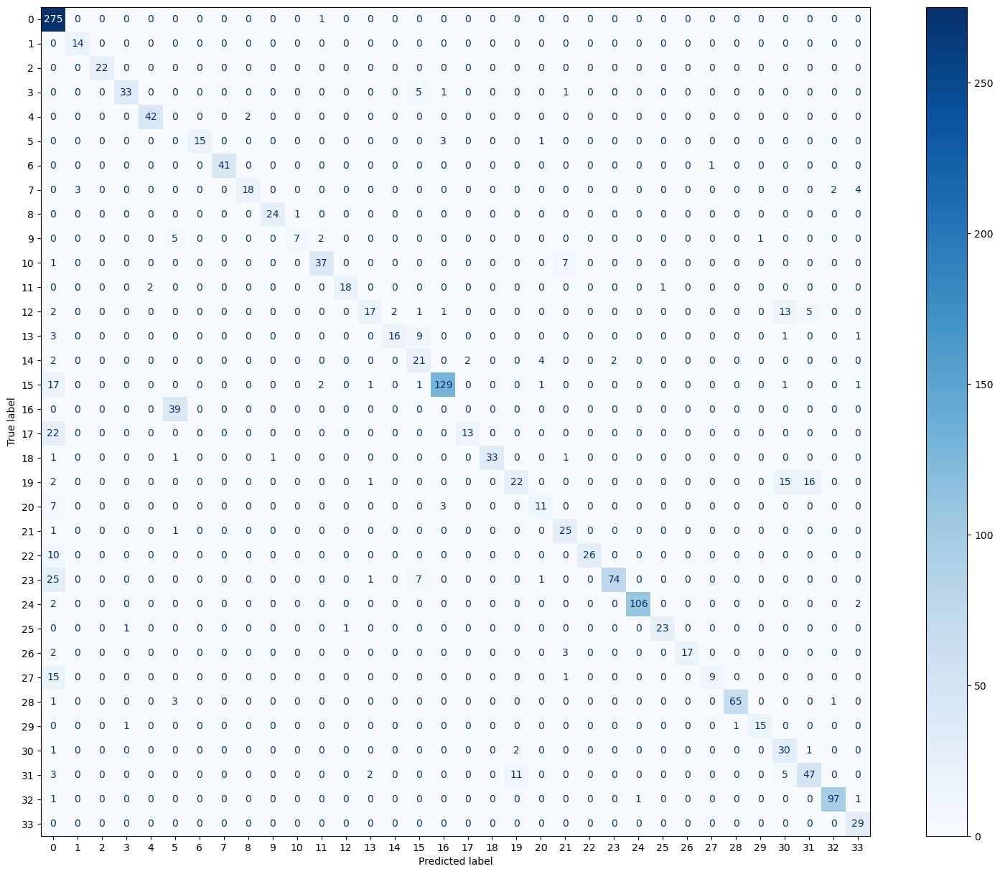

In [95]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix


cfn_matrix  = confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cfn_matrix)
fig, ax = plt.subplots(figsize=(20, 15))
cm_display.plot(ax=ax, cmap='Blues')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

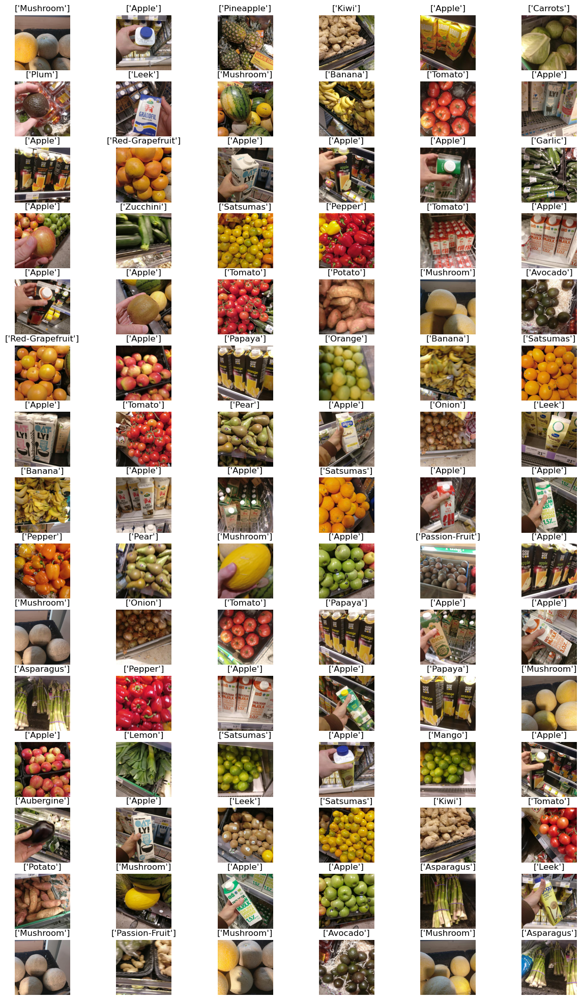

In [ ]:
path_validacion = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/val' 
imagenes=[]
for directorio, subdirectorios, archivos in os.walk(path_validacion):
    for archivo in archivos:
        if archivo.endswith('.jpg') or archivo.endswith('.png'):
            archivo_path = os.path.join(directorio, archivo)
            imagenes.append(archivo_path.replace('\\','/'))


imagenes = random.sample(imagenes, 90)

cont=0
plt.figure(figsize=(15, 25))
for i in imagenes : 
    img_path = i
    img = image.load_img(img_path, target_size=(348, 348))  
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    prediccion = model.predict(img_array)
    clase_predicha = np.argmax(prediccion, axis=1)

    clave = [clave for clave, valor in class_names.items() if valor == clase_predicha]
    ax = plt.subplot(15, 6,cont+1)
    plt.imshow(np.squeeze(img_array))
    plt.title(clave)
    plt.axis("off")
    cont+= 1


plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


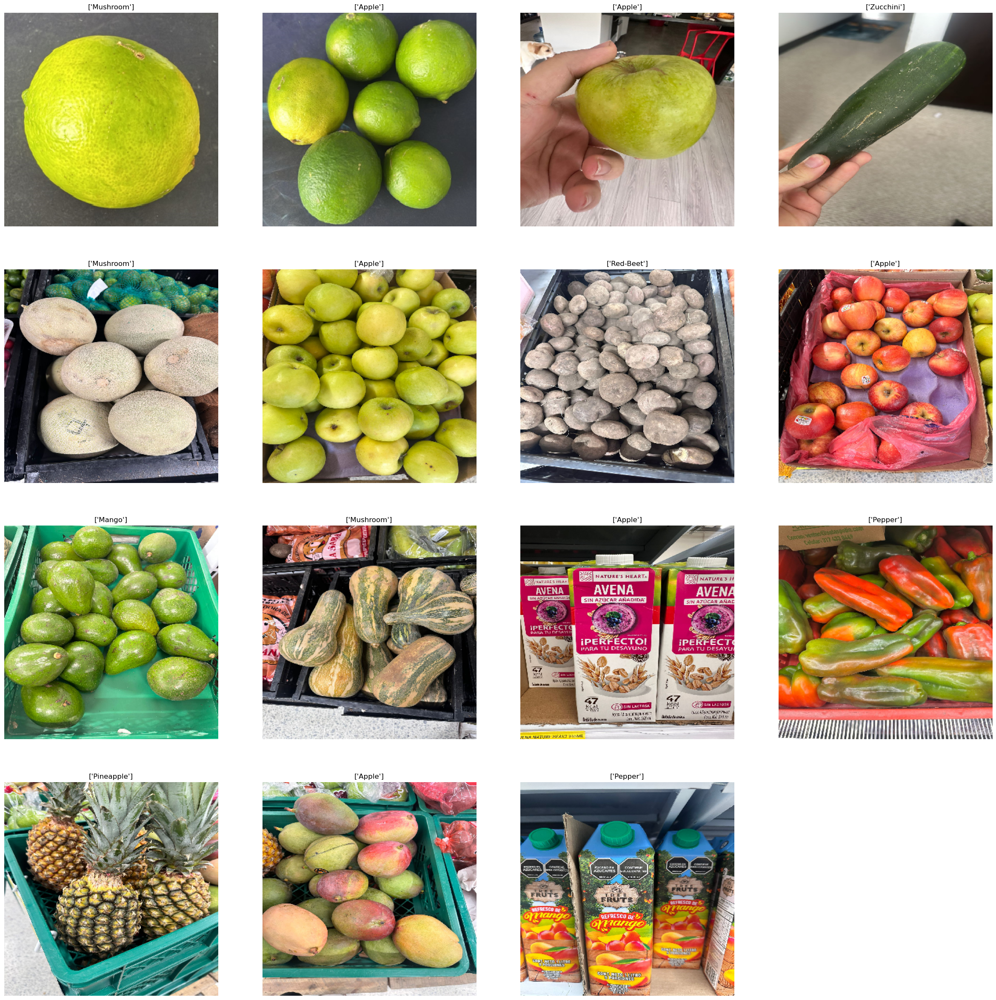

In [98]:
path_validacion = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/Imagenes_prueba/' 
imagenes=[]
for directorio, subdirectorios, archivos in os.walk(path_validacion):
    for archivo in archivos:
        if archivo.endswith('.jpeg') or archivo.endswith('.png'):
            archivo_path = os.path.join(directorio, archivo)
            imagenes.append(archivo_path.replace('\\','/'))
imagenes
#imagenes = [item for item in imagenes if 'Yoggi-Vanilla' in item][0:5]
cont=0
plt.figure(figsize=(30, 30))
for i in imagenes : 
    img_path = i
    img = image.load_img(img_path, target_size=(348, 348))  
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    prediccion = model.predict(img_array)
    clase_predicha = np.argmax(prediccion, axis=1)
    #print("Clase predicha:", clase_predicha[0])

    clave = [clave for clave, valor in class_names.items() if valor == clase_predicha]
    ax = plt.subplot(4, 4,cont+1)
    plt.imshow(np.squeeze(img_array))
    plt.title(clave)
    plt.axis("off")
    cont+= 1